In [1]:
%pwd

'/Users/simmigyeong/Documents/GitHub/ProbonoICT'

In [2]:
# %mv /Users/simmigyeong/Documents/동국대학교/활동/ProbonoICT/dataset/Korean_font_image .

In [3]:
%ls

Car_recognition.ipynb
Data_Guide.txt
Dataset_PreProcessing_Goods_product.ipynb
Exception.ipynb
Korean_font_image/
README.md
example_jupyeter_ver.ipynb
goods_test_annotations.json
goods_train_annotations.json
goods_validation_annotations.json
text_detection_with_CRAFT.ipynb
textinthewild_data_info_json.xlsx
프로보노_수정 방법론.docx


In [4]:
import json

In [5]:
file = json.load(open('./Korean_font_image/Text_in_the_wild/textinthewild_data_info.json'))

### File 구조 EDA

1. file['info'] : 데이터셋 분류 명, 데이터셋 생성 날짜 및 시각


2. file['image'] : 이미지 데이터 식별 번호, 이미지 크기(너비, 높이), 이미지 파일명, 이미지 상품 종류


3. file['annotaion'] : images 값에 존재하는 id = annotations에 존재하는 image_id


- annotations에 존재하는 id와는 다른 값!!!!! 주의! 

4. file['licenses'] : 라이선스 확인

 images 값에 존재하는 id는 annotations 값에서 id가 아닌 image_id와 같은 정보!!!!!!!!!!

In [6]:
# file.keys()
file.keys()

dict_keys(['info', 'images', 'annotations', 'licenses'])

In [7]:
# file["info"]
file['info']

{'name': 'Text in the wild Dataset', 'date_created': '2019-10-14 04:31:48'}

In [8]:
# file['images']
print(type(file['images']))
print()
print(file['images'][:3])

<class 'list'>

[{'id': '00000001', 'width': 1920, 'height': 1440, 'file_name': 'FFF2F34A08347075F55E72B240EFE691.jpg', 'type': 'book'}, {'id': '00000002', 'width': 1920, 'height': 1440, 'file_name': 'FFDE6BAEADC9EDD31E51A1D1F687310F.jpg', 'type': 'book'}, {'id': '00000003', 'width': 1920, 'height': 1440, 'file_name': 'FFCFEB9E1D09544D6B458717DB4D6B7C.jpg', 'type': 'book'}]


In [9]:
# file['annotations']
file['annotations'][:3]

[{'id': '00000001',
  'image_id': '00000001',
  'text': '냉',
  'attributes': {'class': 'character'},
  'bbox': [713, 272, 76, 92]},
 {'id': '00000002',
  'image_id': '00000001',
  'text': '정',
  'attributes': {'class': 'character'},
  'bbox': [798, 289, 74, 94]},
 {'id': '00000003',
  'image_id': '00000001',
  'text': '과',
  'attributes': {'class': 'character'},
  'bbox': [877, 274, 91, 93]}]

In [10]:
# file['licenses']
file['licenses']

[]

In [11]:
file['images'][:]

[{'id': '00000001',
  'width': 1920,
  'height': 1440,
  'file_name': 'FFF2F34A08347075F55E72B240EFE691.jpg',
  'type': 'book'},
 {'id': '00000002',
  'width': 1920,
  'height': 1440,
  'file_name': 'FFDE6BAEADC9EDD31E51A1D1F687310F.jpg',
  'type': 'book'},
 {'id': '00000003',
  'width': 1920,
  'height': 1440,
  'file_name': 'FFCFEB9E1D09544D6B458717DB4D6B7C.jpg',
  'type': 'book'},
 {'id': '00000004',
  'width': 1920,
  'height': 1440,
  'file_name': 'FFA657987BBC93F1B53A5D398D644828.jpg',
  'type': 'book'},
 {'id': '00000005',
  'width': 1920,
  'height': 1438,
  'file_name': 'FF9F7F8E7468ED6E78E640A98279A6F8.jpg',
  'type': 'book'},
 {'id': '00000006',
  'width': 1440,
  'height': 1920,
  'file_name': 'FF78796AFFBF58474995A33D7104123B.jpg',
  'type': 'book'},
 {'id': '00000007',
  'width': 1920,
  'height': 1440,
  'file_name': 'FEE60E107171A712FA88E30E999B5F26.jpg',
  'type': 'book'},
 {'id': '00000008',
  'width': 1920,
  'height': 1440,
  'file_name': 'FED2D72D15DCBC26FAC1C142FD

In [12]:
for i in file['images']:
    print(i)

{'id': '00000001', 'width': 1920, 'height': 1440, 'file_name': 'FFF2F34A08347075F55E72B240EFE691.jpg', 'type': 'book'}
{'id': '00000002', 'width': 1920, 'height': 1440, 'file_name': 'FFDE6BAEADC9EDD31E51A1D1F687310F.jpg', 'type': 'book'}
{'id': '00000003', 'width': 1920, 'height': 1440, 'file_name': 'FFCFEB9E1D09544D6B458717DB4D6B7C.jpg', 'type': 'book'}
{'id': '00000004', 'width': 1920, 'height': 1440, 'file_name': 'FFA657987BBC93F1B53A5D398D644828.jpg', 'type': 'book'}
{'id': '00000005', 'width': 1920, 'height': 1438, 'file_name': 'FF9F7F8E7468ED6E78E640A98279A6F8.jpg', 'type': 'book'}
{'id': '00000006', 'width': 1440, 'height': 1920, 'file_name': 'FF78796AFFBF58474995A33D7104123B.jpg', 'type': 'book'}
{'id': '00000007', 'width': 1920, 'height': 1440, 'file_name': 'FEE60E107171A712FA88E30E999B5F26.jpg', 'type': 'book'}
{'id': '00000008', 'width': 1920, 'height': 1440, 'file_name': 'FED2D72D15DCBC26FAC1C142FD704596.jpg', 'type': 'book'}
{'id': '00000009', 'width': 1920, 'height': 1080

{'id': '00001905', 'width': 1920, 'height': 1440, 'file_name': '8AB2B647C67A15208FFD6565E2B64CE9.jpg', 'type': 'book'}
{'id': '00001906', 'width': 1920, 'height': 1080, 'file_name': '8A89A2639C29DC7BCA28F9C408CAD44E.jpg', 'type': 'book'}
{'id': '00001907', 'width': 1440, 'height': 1920, 'file_name': '8A69578615BBE574C35B215891E6016F.jpg', 'type': 'book'}
{'id': '00001908', 'width': 1920, 'height': 1407, 'file_name': '8A6891BE6E98009EFA830ECDACAC8C4C.jpg', 'type': 'book'}
{'id': '00001909', 'width': 1637, 'height': 1920, 'file_name': '8A4CCEA93D302D8792946A6542D8B281.jpg', 'type': 'book'}
{'id': '00001910', 'width': 1920, 'height': 1440, 'file_name': '8A4C955640DDB64D674E1065A1284FF0.jpg', 'type': 'book'}
{'id': '00001911', 'width': 1920, 'height': 1440, 'file_name': '8A417963B4D4B94D3656C865D43773A7.jpg', 'type': 'book'}
{'id': '00001912', 'width': 1440, 'height': 1920, 'file_name': '8A3448718B8AEAC6125BAE4B6A4407A9.jpg', 'type': 'book'}
{'id': '00001913', 'width': 1920, 'height': 1440

{'id': '00002905', 'width': 1920, 'height': 1080, 'file_name': 'E9D4E7A3D8B74BED4A67D57426E2B998.jpg', 'type': 'sign'}
{'id': '00002906', 'width': 1920, 'height': 1440, 'file_name': 'E9BF633F0946986452B384BFCF40E951.jpg', 'type': 'sign'}
{'id': '00002907', 'width': 1920, 'height': 1440, 'file_name': 'E996157B0B81FA6FF214AAAA528CB98B.jpg', 'type': 'sign'}
{'id': '00002908', 'width': 1920, 'height': 1440, 'file_name': 'E972AC5D1F3838441428B29546D91348.jpg', 'type': 'sign'}
{'id': '00002909', 'width': 1920, 'height': 1080, 'file_name': 'E91CBBF331BD3F1A811DB0612FA9050E.jpg', 'type': 'sign'}
{'id': '00002910', 'width': 1920, 'height': 1440, 'file_name': 'E8C85047ABC1B526AA6DAE97603AB4FA.jpg', 'type': 'sign'}
{'id': '00002911', 'width': 1920, 'height': 1080, 'file_name': 'E841A2C8A00BEC18295579ACB33F8A32.jpg', 'type': 'sign'}
{'id': '00002912', 'width': 1920, 'height': 1440, 'file_name': 'E816C7D4A6B3DF144498664F7B4BD8DF.jpg', 'type': 'sign'}
{'id': '00002913', 'width': 1080, 'height': 1920

{'id': '00004404', 'width': 1920, 'height': 1440, 'file_name': '973F643A30E6612BAAB869C0819D37A9.jpg', 'type': 'sign'}
{'id': '00004405', 'width': 1920, 'height': 1440, 'file_name': '9726FAD231F0D9C804CECB2BD584E143.jpg', 'type': 'sign'}
{'id': '00004406', 'width': 1920, 'height': 1440, 'file_name': '96FF031FB79F6FB642A05C4A9FAD3321.jpg', 'type': 'sign'}
{'id': '00004407', 'width': 1920, 'height': 1440, 'file_name': '96EAE5E5892FD310789781B158FB37A3.jpg', 'type': 'sign'}
{'id': '00004408', 'width': 1920, 'height': 1440, 'file_name': '96E1EFFFF046403ABE8F1F49D519C839.jpg', 'type': 'sign'}
{'id': '00004409', 'width': 1920, 'height': 1440, 'file_name': '96DE3F6F8941684CD847060D7AEFFC0B.jpg', 'type': 'sign'}
{'id': '00004410', 'width': 1920, 'height': 1440, 'file_name': '96B97D717B037C074036FB75BB5AFD4B.jpg', 'type': 'sign'}
{'id': '00004411', 'width': 1920, 'height': 1440, 'file_name': '96A2A8BCF341372BA3D5CB3FE8CD6C7F.jpg', 'type': 'sign'}
{'id': '00004412', 'width': 1920, 'height': 1440

{'id': '00005904', 'width': 1920, 'height': 1440, 'file_name': 'CF5379A302A6217628B608CA0D60F837.jpg', 'type': 'book'}
{'id': '00005905', 'width': 1920, 'height': 1440, 'file_name': 'CF3A27C52979A449C2B00B03CEAF4DB7.jpg', 'type': 'book'}
{'id': '00005906', 'width': 1920, 'height': 1440, 'file_name': 'CF35913700A6007AC5456BA9033D7D42.jpg', 'type': 'book'}
{'id': '00005907', 'width': 1920, 'height': 933, 'file_name': 'CF30338C8E959F25328CB9815C7C9C66.jpg', 'type': 'book'}
{'id': '00005908', 'width': 1920, 'height': 1440, 'file_name': 'CF230EEDA35033999896AE0AB045B99C.jpg', 'type': 'book'}
{'id': '00005909', 'width': 1920, 'height': 1440, 'file_name': 'CEB87CE847BE329A3C2546537F0E256D.jpg', 'type': 'book'}
{'id': '00005910', 'width': 1920, 'height': 1440, 'file_name': 'CEB6CD8D92208DD0E47F39F3C787443F.jpg', 'type': 'book'}
{'id': '00005911', 'width': 1920, 'height': 1440, 'file_name': 'CEAFA4FB0499A6D9980BABBB0510F37D.jpg', 'type': 'book'}
{'id': '00005912', 'width': 1920, 'height': 1440,

{'id': '00007403', 'width': 1920, 'height': 1440, 'file_name': '3298F4259B7790754A5ACEE1172462C9.jpg', 'type': 'book'}
{'id': '00007404', 'width': 1440, 'height': 1920, 'file_name': '329138A0ABB694E178B5CBE5DDFB1A64.jpg', 'type': 'book'}
{'id': '00007405', 'width': 1920, 'height': 1440, 'file_name': '328CE6FBA63BF1029188F38BD72F74B0.jpg', 'type': 'book'}
{'id': '00007406', 'width': 1920, 'height': 1440, 'file_name': '32830997E010CDF3AE43DB7B4871FC27.jpg', 'type': 'book'}
{'id': '00007407', 'width': 1920, 'height': 1440, 'file_name': '326C7623C8156B92E60AC52B1E0C1C9E.jpg', 'type': 'book'}
{'id': '00007408', 'width': 1920, 'height': 1440, 'file_name': '32669A8A859FB82447A7E76D6EDF0D41.jpg', 'type': 'book'}
{'id': '00007409', 'width': 1920, 'height': 1080, 'file_name': '3263EFF369BC4D957519096865F47F53.jpg', 'type': 'book'}
{'id': '00007410', 'width': 1920, 'height': 1440, 'file_name': '323C93BA8FDF38C27F97189510A57BC3.jpg', 'type': 'book'}
{'id': '00007411', 'width': 1920, 'height': 1440

{'id': '00008903', 'width': 1920, 'height': 1440, 'file_name': 'A17C840B6DF34FB9FA2A1A75503E19BA.jpg', 'type': 'book'}
{'id': '00008904', 'width': 1920, 'height': 1440, 'file_name': 'A1292E9B8D80C17EC3B88768684BE4CB.jpg', 'type': 'book'}
{'id': '00008905', 'width': 1920, 'height': 1440, 'file_name': 'A121AEF9FA9643966C85833A93C52238.jpg', 'type': 'book'}
{'id': '00008906', 'width': 1920, 'height': 1440, 'file_name': 'A11C22186EA2AE826DE31D725E675623.jpg', 'type': 'book'}
{'id': '00008907', 'width': 1920, 'height': 1440, 'file_name': 'A10E857B41C1B6105F94A474D7065323.jpg', 'type': 'book'}
{'id': '00008908', 'width': 1920, 'height': 1440, 'file_name': 'A10604F19CB9C702D904E076DDCE477A.jpg', 'type': 'book'}
{'id': '00008909', 'width': 1920, 'height': 1440, 'file_name': 'A0F115002DB2EC15D3D28CF083E32EBB.jpg', 'type': 'book'}
{'id': '00008910', 'width': 1920, 'height': 1440, 'file_name': 'A0D4180917266FFB24ACB585D6F3AF73.jpg', 'type': 'book'}
{'id': '00008911', 'width': 1920, 'height': 1440

{'id': '00010402', 'width': 1920, 'height': 1080, 'file_name': 'C4C8EF73BCF3B1F2B1739673CB325B02.jpg', 'type': 'product'}
{'id': '00010403', 'width': 1920, 'height': 1440, 'file_name': 'C3FB1E64DFCF4BEA83C9BC32F950C931.jpg', 'type': 'product'}
{'id': '00010404', 'width': 1920, 'height': 1080, 'file_name': 'C3D8887BBD6C04F5516EC598A993DE7D.jpg', 'type': 'product'}
{'id': '00010405', 'width': 1920, 'height': 1441, 'file_name': 'C3A14540C4C9C2FC9A6F6F03E58EC377.jpg', 'type': 'product'}
{'id': '00010406', 'width': 1920, 'height': 1080, 'file_name': 'C39A8B978CAFCBD68411D6720B347A2F.jpg', 'type': 'product'}
{'id': '00010407', 'width': 1920, 'height': 1440, 'file_name': 'C373CF11FAB8794514E46BCB68501004.jpg', 'type': 'product'}
{'id': '00010408', 'width': 1920, 'height': 1405, 'file_name': 'C35EBDC806A2D8D33F9A7EE0F83DA8C0.jpg', 'type': 'product'}
{'id': '00010409', 'width': 1440, 'height': 1920, 'file_name': 'C347A45BC256A54E7975FE33E3F06A62.jpg', 'type': 'product'}
{'id': '00010410', 'widt

{'id': '00011902', 'width': 1920, 'height': 1440, 'file_name': 'D817CA401A2F6FD6641EED5FE818683D.jpg', 'type': 'product'}
{'id': '00011903', 'width': 1920, 'height': 933, 'file_name': 'D7E90CABF064029CDB53879453C8C119.jpg', 'type': 'product'}
{'id': '00011904', 'width': 1440, 'height': 1920, 'file_name': 'D7D139505924DC34258AB5A4B7F4EF18.jpg', 'type': 'product'}
{'id': '00011905', 'width': 1920, 'height': 1440, 'file_name': 'D7CB9B2DC75F4871423DB89620F8FA35.jpg', 'type': 'product'}
{'id': '00011906', 'width': 1920, 'height': 1440, 'file_name': 'D7C3C4325F8FA8E692823E36AAF1B3AD.jpg', 'type': 'product'}
{'id': '00011907', 'width': 1920, 'height': 1080, 'file_name': 'D7B8FF02DDA0F63B164A9FB098BF4339.jpg', 'type': 'product'}
{'id': '00011908', 'width': 1920, 'height': 1080, 'file_name': 'D7B64D8988A5ABA921D26D9F2A834C9B.jpg', 'type': 'product'}
{'id': '00011909', 'width': 1920, 'height': 1440, 'file_name': 'D7A1752F53E62287C1C3523DB3F197E7.jpg', 'type': 'product'}
{'id': '00011910', 'width

{'id': '00013401', 'width': 1517, 'height': 1920, 'file_name': '5B54BC4D8513298796A8FAF328FE5B17.jpg', 'type': 'product'}
{'id': '00013402', 'width': 1920, 'height': 1440, 'file_name': '5B52AADCA96B585568A06F9517738D56.jpg', 'type': 'product'}
{'id': '00013403', 'width': 1440, 'height': 1920, 'file_name': '5B30385782CDBA92091510FE7E22EE54.jpg', 'type': 'product'}
{'id': '00013404', 'width': 1920, 'height': 1080, 'file_name': '5B26C27EE0224BEF8B07B5D624EDFCFF.jpg', 'type': 'product'}
{'id': '00013405', 'width': 1920, 'height': 1440, 'file_name': '5B1E34BB9F46AA529456B9D6FFB80739.jpg', 'type': 'product'}
{'id': '00013406', 'width': 1920, 'height': 1440, 'file_name': '5B1BCA71057E4CD1A4BB6E9975C47689.jpg', 'type': 'product'}
{'id': '00013407', 'width': 1920, 'height': 1080, 'file_name': '5AF9F2AB8E00D96814DADFD8F9A05CDD.jpg', 'type': 'product'}
{'id': '00013408', 'width': 1692, 'height': 1920, 'file_name': '5AD9C779052D8A45B3C868B7A5EFAD13.jpg', 'type': 'product'}
{'id': '00013409', 'widt

{'id': '00014901', 'width': 1920, 'height': 1440, 'file_name': '7B3D2D822F93AC3E7A46E46F118748B0.jpg', 'type': 'traffic sign'}
{'id': '00014902', 'width': 1920, 'height': 933, 'file_name': '7AFBE140A022D63B2C7FD7FEF242BD1E.jpg', 'type': 'traffic sign'}
{'id': '00014903', 'width': 1920, 'height': 1440, 'file_name': '7AC293292624215A214ADD6715239296.jpg', 'type': 'traffic sign'}
{'id': '00014904', 'width': 1920, 'height': 1440, 'file_name': '7A7C24E616EC8B4E0A1F30980E9438B5.jpg', 'type': 'traffic sign'}
{'id': '00014905', 'width': 1920, 'height': 1440, 'file_name': '7A78FC4F9E0A2E205491DAC0F17BEF44.jpg', 'type': 'traffic sign'}
{'id': '00014906', 'width': 1920, 'height': 1440, 'file_name': '7A78386CAAE291C7AFBA9FAA1BDB415A.jpg', 'type': 'traffic sign'}
{'id': '00014907', 'width': 1920, 'height': 1080, 'file_name': '7A1E97A5DBC8ECBBAF0467E9058FA10C.jpg', 'type': 'traffic sign'}
{'id': '00014908', 'width': 1920, 'height': 1080, 'file_name': '793208B985FEC73E162B6741EF29834C.jpg', 'type': '

{'id': '00016400', 'width': 1920, 'height': 1285, 'file_name': '60CE74F5AB412FCBDF000414FC950818.jpg', 'type': 'traffic sign'}
{'id': '00016401', 'width': 1920, 'height': 1440, 'file_name': '60C8D0CB8F7F8EC787B35FBCCA6F8AC0.jpg', 'type': 'traffic sign'}
{'id': '00016402', 'width': 1080, 'height': 1920, 'file_name': '608A356E00BFCA5E6084FE4040848E86.jpg', 'type': 'traffic sign'}
{'id': '00016403', 'width': 1920, 'height': 1440, 'file_name': '608371CDB5B72FB85F827E1322F4AF7F.jpg', 'type': 'traffic sign'}
{'id': '00016404', 'width': 1920, 'height': 1440, 'file_name': '60763D9AE2C55998A347CECE7AA46553.jpg', 'type': 'traffic sign'}
{'id': '00016405', 'width': 1920, 'height': 1080, 'file_name': '605F7195ADFAF80D80AD2890A6AE89B0.jpg', 'type': 'traffic sign'}
{'id': '00016406', 'width': 1920, 'height': 1275, 'file_name': '605A0BDA732A3DF2449B41BE62BC860B.jpg', 'type': 'traffic sign'}
{'id': '00016407', 'width': 1920, 'height': 1080, 'file_name': '5FFD7B26F872436BA52678E9D13E67DD.jpg', 'type': 

{'id': '00017900', 'width': 1920, 'height': 1440, 'file_name': '64538CF600718028C1177D9DCD836C64.jpg', 'type': 'traffic sign'}
{'id': '00017901', 'width': 1920, 'height': 1080, 'file_name': '644A8B5F24DF7C0520D8D40DEE9F58F1.jpg', 'type': 'traffic sign'}
{'id': '00017902', 'width': 1920, 'height': 1080, 'file_name': '63D22E3E854A25F03648603D322C2B1C.jpg', 'type': 'traffic sign'}
{'id': '00017903', 'width': 1920, 'height': 1080, 'file_name': '63C4F68B0DDFFCAFB0FE7F7AB9F9D327.jpg', 'type': 'traffic sign'}
{'id': '00017904', 'width': 1920, 'height': 1280, 'file_name': '63A992712DDD5E81E8EDA2972894E301.jpg', 'type': 'traffic sign'}
{'id': '00017905', 'width': 1920, 'height': 1080, 'file_name': '6359C16FBA216123FCDA8E943FFAC1BD.jpg', 'type': 'traffic sign'}
{'id': '00017906', 'width': 1920, 'height': 1280, 'file_name': '63214813DAAA076218D4D9F8EEC61627.jpg', 'type': 'traffic sign'}
{'id': '00017907', 'width': 1920, 'height': 1280, 'file_name': '6298151BBF6EF4D465D7FA067C19D096.jpg', 'type': 

{'id': '00019399', 'width': 1920, 'height': 1280, 'file_name': 'AABD4479817A509F2C7EBBCD89445316.jpg', 'type': 'traffic sign'}
{'id': '00019400', 'width': 1920, 'height': 1440, 'file_name': 'AAAB9C97537E4FDB98C98A7F80D762A0.jpg', 'type': 'traffic sign'}
{'id': '00019401', 'width': 1920, 'height': 507, 'file_name': 'AA9D434ABF4B7397018A7CD0537D0008.jpg', 'type': 'traffic sign'}
{'id': '00019402', 'width': 1920, 'height': 1440, 'file_name': 'AA9C3575ED540F8833FD612E246A4B0C.jpg', 'type': 'traffic sign'}
{'id': '00019403', 'width': 1920, 'height': 1440, 'file_name': 'AA8C9A6AE04050C62C62BFD107E017B1.jpg', 'type': 'traffic sign'}
{'id': '00019404', 'width': 1920, 'height': 1440, 'file_name': 'AA83773351875329D63BFE1F713AFB7F.jpg', 'type': 'traffic sign'}
{'id': '00019405', 'width': 1478, 'height': 1920, 'file_name': 'AA730FC218987CCA109D04189E3EFAC7.jpg', 'type': 'traffic sign'}
{'id': '00019406', 'width': 1920, 'height': 1440, 'file_name': 'AA60ECAE42BFFE6EAA495F38BD03FB48.jpg', 'type': '

{'id': '00020899', 'width': 1920, 'height': 1440, 'file_name': '285CD4AB59A7E5C7DFD4D141464F9253.jpg', 'type': 'traffic sign'}
{'id': '00020900', 'width': 1920, 'height': 1280, 'file_name': '2853D2DE4850D8C3B44E45C1D358062E.jpg', 'type': 'traffic sign'}
{'id': '00020901', 'width': 1920, 'height': 1280, 'file_name': '283BA7448795498C1A6838BCF1719105.jpg', 'type': 'traffic sign'}
{'id': '00020902', 'width': 1920, 'height': 1440, 'file_name': '283599B816D674D1A0DCBD701F16B98B.jpg', 'type': 'traffic sign'}
{'id': '00020903', 'width': 1920, 'height': 1216, 'file_name': '282E75EB41B9D09482BBB23D51046C07.jpg', 'type': 'traffic sign'}
{'id': '00020904', 'width': 1920, 'height': 1440, 'file_name': '28106CBF7F5288E5EF19683425793089.jpg', 'type': 'traffic sign'}
{'id': '00020905', 'width': 1920, 'height': 1440, 'file_name': '280546E14383299FDD0A956A507407BC.jpg', 'type': 'traffic sign'}
{'id': '00020906', 'width': 1920, 'height': 1440, 'file_name': '27FC55EA5FB535E025D78F8EF5ECF498.jpg', 'type': 

{'id': '00022398', 'width': 1920, 'height': 1440, 'file_name': '36C3E21B524CE95ED5B1ECD02BBB2A66.jpg', 'type': 'sign'}
{'id': '00022399', 'width': 1920, 'height': 1440, 'file_name': '36BDDCDF154A128EDB64FF95ECAD71B4.jpg', 'type': 'sign'}
{'id': '00022400', 'width': 1920, 'height': 1440, 'file_name': '36A24290A64E13BC71F8830D5B7082C9.jpg', 'type': 'sign'}
{'id': '00022401', 'width': 1920, 'height': 1080, 'file_name': '368B315FFCF4950727E27ED4753A12D6.jpg', 'type': 'sign'}
{'id': '00022402', 'width': 1920, 'height': 1440, 'file_name': '36859F5564237DFEFD6A95510837D743.jpg', 'type': 'sign'}
{'id': '00022403', 'width': 1920, 'height': 1080, 'file_name': '36445E5BB60690F164F85CA0087D52CB.jpg', 'type': 'sign'}
{'id': '00022404', 'width': 1920, 'height': 1080, 'file_name': '363FB8A8B4E6BE2A4D3EBEB017B1F589.jpg', 'type': 'sign'}
{'id': '00022405', 'width': 1920, 'height': 1440, 'file_name': '35E4A7127F99799DE022DEB5768AF24B.jpg', 'type': 'sign'}
{'id': '00022406', 'width': 1920, 'height': 1440

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{'id': '00047390', 'width': 1920, 'height': 1440, 'file_name': 'E84B5000242D38629A3229241828F18D.jpg', 'type': 'book'}
{'id': '00047391', 'width': 1920, 'height': 1440, 'file_name': 'E83A73A2A800C882CB08689CD005D6BE.jpg', 'type': 'book'}
{'id': '00047392', 'width': 1920, 'height': 1440, 'file_name': 'E835BEBBEE8D2CC045C7851BFEA1D7EB.jpg', 'type': 'book'}
{'id': '00047393', 'width': 1920, 'height': 1440, 'file_name': 'E809F00712B126AE4350640FA77D05D5.jpg', 'type': 'book'}
{'id': '00047394', 'width': 1920, 'height': 1080, 'file_name': 'E8081C6D2033ECF0B393348ECE0321B2.jpg', 'type': 'book'}
{'id': '00047395', 'width': 1920, 'height': 1440, 'file_name': 'E7EF488D18DFB0953A7C0CF81F0DAFDA.jpg', 'type': 'book'}
{'id': '00047396', 'width': 1920, 'height': 933, 'file_name': 'E7D652FC1101BDAA15BDF474F5F67064.jpg', 'type': 'book'}
{'id': '00047397', 'width': 1920, 'height': 1440, 'file_name': 'E7941AF4D8CD72011CC2B40D19ACA077.jpg', 'type': 'book'}
{'id': '00047398', 'width': 1920, 'height': 1298,

{'id': '00048389', 'width': 1920, 'height': 1440, 'file_name': '57960AF5C325A525930C7C4AA165739B.jpg', 'type': 'book'}
{'id': '00048390', 'width': 1920, 'height': 1440, 'file_name': '578EA0DEA84F8785FB3AB967970F5434.jpg', 'type': 'book'}
{'id': '00048391', 'width': 1920, 'height': 933, 'file_name': '577BE5FD2F61FE647B6A7E4BE462442D.jpg', 'type': 'book'}
{'id': '00048392', 'width': 1920, 'height': 1440, 'file_name': '576725152FF7AA26D0B8A78371A26288.jpg', 'type': 'book'}
{'id': '00048393', 'width': 1920, 'height': 1440, 'file_name': '56F23769F95F6762380EDFCA1A5B3715.jpg', 'type': 'book'}
{'id': '00048394', 'width': 1440, 'height': 1920, 'file_name': '56C893F2EFEC12ECC6523049D6602098.jpg', 'type': 'book'}
{'id': '00048395', 'width': 1920, 'height': 1080, 'file_name': '56BAA4188C5A6A9A49338155E5F5D563.jpg', 'type': 'book'}
{'id': '00048396', 'width': 1920, 'height': 1440, 'file_name': '56A11B2235AE0BCA214CD202D5375055.jpg', 'type': 'book'}
{'id': '00048397', 'width': 1920, 'height': 1440,

{'id': '00050389', 'width': 1920, 'height': 1080, 'file_name': '3B32373FF3366B1B656B03D31D586A31.jpg', 'type': 'traffic sign'}
{'id': '00050390', 'width': 1920, 'height': 1080, 'file_name': '3B2E1A66FF5310E75E57E4B25200803E.jpg', 'type': 'traffic sign'}
{'id': '00050391', 'width': 1920, 'height': 1281, 'file_name': '3B17EA50FCB9B3AE3F73B3C1950CDB70.jpg', 'type': 'traffic sign'}
{'id': '00050392', 'width': 1920, 'height': 1080, 'file_name': '3B10FF61F698D036C0FE17E6EE63F17D.jpg', 'type': 'traffic sign'}
{'id': '00050393', 'width': 1920, 'height': 1440, 'file_name': '3AAEFFA069C6644DCE8C744AA918EDDE.jpg', 'type': 'traffic sign'}
{'id': '00050394', 'width': 1920, 'height': 1280, 'file_name': '3A92A34489E88AC4F9C733C25840160B.jpg', 'type': 'traffic sign'}
{'id': '00050395', 'width': 1920, 'height': 1080, 'file_name': '3A83C217D6441C49CF81989A61C0EF97.jpg', 'type': 'traffic sign'}
{'id': '00050396', 'width': 1920, 'height': 1440, 'file_name': '3A7839DD04973BD27392621F2D18FDB6.jpg', 'type': 

{'id': '00051388', 'width': 1920, 'height': 1080, 'file_name': '4BB7CDCA6B76DCE686589767785902C5.jpg', 'type': 'traffic sign'}
{'id': '00051389', 'width': 1920, 'height': 1080, 'file_name': '4BA6C95D5F85265ACB2FF800A502AE27.jpg', 'type': 'traffic sign'}
{'id': '00051390', 'width': 1920, 'height': 1080, 'file_name': '4BA58E04F7FF657A47E6556E02BE89AA.jpg', 'type': 'traffic sign'}
{'id': '00051391', 'width': 1920, 'height': 1188, 'file_name': '4AFEDC323AA873C737AF4CC33B63EDF2.jpg', 'type': 'traffic sign'}
{'id': '00051392', 'width': 1920, 'height': 1440, 'file_name': '4AECA00ACE69FEC19865CE2BC1E7C5F1.jpg', 'type': 'traffic sign'}
{'id': '00051393', 'width': 1920, 'height': 1080, 'file_name': '4A04021D17D443343231C96299AC93BB.jpg', 'type': 'traffic sign'}
{'id': '00051394', 'width': 1920, 'height': 1440, 'file_name': '49CF894B4651906D7EE09B1FBB26EB85.jpg', 'type': 'traffic sign'}
{'id': '00051395', 'width': 1920, 'height': 1080, 'file_name': '499E62884307C572F7F97510696C78BB.jpg', 'type': 

{'id': '00053388', 'width': 1920, 'height': 1280, 'file_name': '6B8AB6BF06E8F4EB856332F043A37F81.jpg', 'type': 'sign'}
{'id': '00053389', 'width': 1920, 'height': 1281, 'file_name': '6B692FCC3E1919327A4161D3F1CD65DC.jpg', 'type': 'sign'}
{'id': '00053390', 'width': 1920, 'height': 1081, 'file_name': '6B63859A64DF5AEDD7919C519138F925.jpg', 'type': 'sign'}
{'id': '00053391', 'width': 1920, 'height': 1280, 'file_name': '6B5F6F73DDB703D7EDAF422CF1DE939A.jpg', 'type': 'sign'}
{'id': '00053392', 'width': 1920, 'height': 1079, 'file_name': '6B5E0971A8137699090A0BB1441B9FFA.jpg', 'type': 'sign'}
{'id': '00053393', 'width': 1920, 'height': 1080, 'file_name': '6B4E1B1AB28BC854F9B700AA9670F125.jpg', 'type': 'sign'}
{'id': '00053394', 'width': 1920, 'height': 1081, 'file_name': '6B4070533D17CFE8C80AD6F84C25F2A7.jpg', 'type': 'sign'}
{'id': '00053395', 'width': 1920, 'height': 1440, 'file_name': '6B25F1D48A9D0093CC5E9BBF786B0C74.jpg', 'type': 'sign'}
{'id': '00053396', 'width': 1920, 'height': 1079

{'id': '00054387', 'width': 1920, 'height': 1440, 'file_name': '11D77FB8DE1569BD313C2EA611B8854B.jpg', 'type': 'sign'}
{'id': '00054388', 'width': 1920, 'height': 1440, 'file_name': '11C64F6A9A52264591D21C30739DAFAC.jpg', 'type': 'sign'}
{'id': '00054389', 'width': 1920, 'height': 1440, 'file_name': '11AECE362ABA45F98E62DA5F59FA02FB.jpg', 'type': 'sign'}
{'id': '00054390', 'width': 1920, 'height': 1440, 'file_name': '1195BC30D30596E65DFCA066BE0C9E48.jpg', 'type': 'sign'}
{'id': '00054391', 'width': 1920, 'height': 1081, 'file_name': '117BF6F65D8415298AB515EEC1D5BA68.jpg', 'type': 'sign'}
{'id': '00054392', 'width': 1920, 'height': 1097, 'file_name': '114F3D27A66EB2F170BD107A60B3A795.jpg', 'type': 'sign'}
{'id': '00054393', 'width': 1920, 'height': 1280, 'file_name': '11388070F0183368A5D237F66A01044C.jpg', 'type': 'sign'}
{'id': '00054394', 'width': 1920, 'height': 1080, 'file_name': '1136BBFBE3C2353D0EF610D3D66EA411.jpg', 'type': 'sign'}
{'id': '00054395', 'width': 1920, 'height': 1080

{'id': '00056387', 'width': 1920, 'height': 1080, 'file_name': 'DC07A39D462A9900F92D56175F043D92.jpg', 'type': 'product'}
{'id': '00056388', 'width': 1920, 'height': 1080, 'file_name': 'DC0068660B6F105E8E39432129073810.jpg', 'type': 'product'}
{'id': '00056389', 'width': 1920, 'height': 1280, 'file_name': 'DBF2B87AC325C3E1F3ED7B3F2C2BED96.jpg', 'type': 'product'}
{'id': '00056390', 'width': 1440, 'height': 1920, 'file_name': 'DBF2454C97B8FE21E590DE3EBD399B72.jpg', 'type': 'product'}
{'id': '00056391', 'width': 1920, 'height': 1440, 'file_name': 'DBA8E7B99D8F91D401159098C0E3D965.jpg', 'type': 'product'}
{'id': '00056392', 'width': 1920, 'height': 1240, 'file_name': 'DB75B4B43DE3852B7A5C8AF2DF9AD4E3.jpg', 'type': 'product'}
{'id': '00056393', 'width': 1920, 'height': 1440, 'file_name': 'DB56E44BF6375E0FE47D6F28F62F6837.jpg', 'type': 'product'}
{'id': '00056394', 'width': 1920, 'height': 1080, 'file_name': 'DB50F19F331F64459A74BB3AB3B245B0.jpg', 'type': 'product'}
{'id': '00056395', 'widt

{'id': '00057386', 'width': 1920, 'height': 1080, 'file_name': '61D8D77A46DA55E28D82AAE9A0C6D666.jpg', 'type': 'product'}
{'id': '00057387', 'width': 1920, 'height': 1440, 'file_name': '61CA13E63107F62AF43F3025DB347124.jpg', 'type': 'product'}
{'id': '00057388', 'width': 1440, 'height': 1920, 'file_name': '6192BCD7037D442F7A76AE41A6A689B8.jpg', 'type': 'product'}
{'id': '00057389', 'width': 1920, 'height': 1080, 'file_name': '614564CC00919D7FD9B753593BC81EA5.jpg', 'type': 'product'}
{'id': '00057390', 'width': 1920, 'height': 1440, 'file_name': '611BF24107BA60F12CBB038C9CC0D361.jpg', 'type': 'product'}
{'id': '00057391', 'width': 1920, 'height': 1280, 'file_name': '6095A67B74FC5AAB4CEFD5F5A9D39D88.jpg', 'type': 'product'}
{'id': '00057392', 'width': 1920, 'height': 1440, 'file_name': '608A24602AFE817D9198EFDADE66108C.jpg', 'type': 'product'}
{'id': '00057393', 'width': 1920, 'height': 1440, 'file_name': '6087FA9B2F95910023CD5E25BA5AC949.jpg', 'type': 'product'}
{'id': '00057394', 'widt

{'id': '00059386', 'width': 1920, 'height': 1080, 'file_name': 'CEC06AEAE953E1244CC626222FE99D28.jpg', 'type': 'traffic sign'}
{'id': '00059387', 'width': 1920, 'height': 1281, 'file_name': 'CEB492881DB431FADC73226040C1804E.jpg', 'type': 'traffic sign'}
{'id': '00059388', 'width': 1920, 'height': 1080, 'file_name': 'CEA8EAA67C2C45EFBA907E4AD0E4DEE9.jpg', 'type': 'traffic sign'}
{'id': '00059389', 'width': 1920, 'height': 1440, 'file_name': 'CEA347DBF9DF30AE841C2E79A7390963.jpg', 'type': 'traffic sign'}
{'id': '00059390', 'width': 1920, 'height': 1281, 'file_name': 'CE7BD1785CC5D2E29354015614D8008D.jpg', 'type': 'traffic sign'}
{'id': '00059391', 'width': 1920, 'height': 1281, 'file_name': 'CE6093BF36F4FD73E8F199DC5312EFE3.jpg', 'type': 'traffic sign'}
{'id': '00059392', 'width': 1920, 'height': 1281, 'file_name': 'CE5A4986D6EF8A3447C5D4A41309342A.jpg', 'type': 'traffic sign'}
{'id': '00059393', 'width': 1920, 'height': 1440, 'file_name': 'CE5789997F29B79749EE2AAF713E72A0.jpg', 'type': 

{'id': '00060385', 'width': 1920, 'height': 1080, 'file_name': '76407D76502E2484872CFC212ED6E91F.jpg', 'type': 'traffic sign'}
{'id': '00060386', 'width': 1920, 'height': 1440, 'file_name': '762526168853EB00795DA184C1490E50.jpg', 'type': 'traffic sign'}
{'id': '00060387', 'width': 1920, 'height': 1081, 'file_name': '7610B99A9CE7E8D777157F6254AB82A4.jpg', 'type': 'traffic sign'}
{'id': '00060388', 'width': 1920, 'height': 1080, 'file_name': '7602970E9AE1F3866A1CCA5C7C60B888.jpg', 'type': 'traffic sign'}
{'id': '00060389', 'width': 1920, 'height': 1081, 'file_name': '75F222F873DB31D67B5812A304BE6220.jpg', 'type': 'traffic sign'}
{'id': '00060390', 'width': 1920, 'height': 1440, 'file_name': '75E4FEED6E86451E07FC38FC70EEDED6.jpg', 'type': 'traffic sign'}
{'id': '00060391', 'width': 1920, 'height': 1080, 'file_name': '75DE15AE995428CC95F14BBFA493053A.jpg', 'type': 'traffic sign'}
{'id': '00060392', 'width': 1920, 'height': 1281, 'file_name': '75D5003E12B8E692D0175AA4BCB2B4B1.jpg', 'type': 

{'id': '00062385', 'width': 1920, 'height': 1080, 'file_name': '948075E0DA9F9ED6C7BC2EA800B7DD46.jpg', 'type': 'traffic sign'}
{'id': '00062386', 'width': 1920, 'height': 1080, 'file_name': '94759FD995039A30C376F226C978533E.jpg', 'type': 'traffic sign'}
{'id': '00062387', 'width': 1920, 'height': 1281, 'file_name': '946C4C7E8ACA2AF5F1F4CB9508346126.jpg', 'type': 'traffic sign'}
{'id': '00062388', 'width': 1920, 'height': 1440, 'file_name': '943CCDB75416633764C019BEF6181A09.jpg', 'type': 'traffic sign'}
{'id': '00062389', 'width': 1920, 'height': 1080, 'file_name': '9406DBE92A516906021443B1E36952B2.jpg', 'type': 'traffic sign'}
{'id': '00062390', 'width': 1920, 'height': 1281, 'file_name': '92C24B035502555935C72CECD046FC45.jpg', 'type': 'traffic sign'}
{'id': '00062391', 'width': 1920, 'height': 1080, 'file_name': '91FE1915244A5886C1193ECF44A5255B.jpg', 'type': 'traffic sign'}
{'id': '00062392', 'width': 1920, 'height': 1280, 'file_name': '91F8D57109536F04A9CB5A99DB1DF890.jpg', 'type': 

{'id': '00063384', 'width': 1920, 'height': 1440, 'file_name': 'DC869EE16A073EFD6C933692362A252F.jpg', 'type': 'book'}
{'id': '00063385', 'width': 1920, 'height': 1920, 'file_name': 'DC81FFC3984029B27205D9BE6A829572.jpg', 'type': 'book'}
{'id': '00063386', 'width': 1920, 'height': 1440, 'file_name': 'DC6CDB0B7EA08ECEE8167973284F6552.jpg', 'type': 'book'}
{'id': '00063387', 'width': 1920, 'height': 1268, 'file_name': 'DC5E48ED578C8DFE61C1E73B102BDEDD.jpg', 'type': 'book'}
{'id': '00063388', 'width': 1920, 'height': 933, 'file_name': 'DC12E42CFF99A96665A23786DB25D7C2.jpg', 'type': 'book'}
{'id': '00063389', 'width': 1920, 'height': 1280, 'file_name': 'DBF42A36CE44541D626CCC096DA7B02E.jpg', 'type': 'book'}
{'id': '00063390', 'width': 1920, 'height': 1440, 'file_name': 'DBE3A5A84185F5AC86EE28ED0DF8FF42.jpg', 'type': 'book'}
{'id': '00063391', 'width': 1920, 'height': 1317, 'file_name': 'DBBF879DB64D3A0D01208212B2962C76.jpg', 'type': 'book'}
{'id': '00063392', 'width': 1920, 'height': 1280,

{'id': '00065384', 'width': 1920, 'height': 1440, 'file_name': '7F6C08215723C2A44E392AEF2A5E5999.jpg', 'type': 'book'}
{'id': '00065385', 'width': 1920, 'height': 1440, 'file_name': '7EF11AE8B861627AA2DB61094B83A6EF.jpg', 'type': 'book'}
{'id': '00065386', 'width': 1920, 'height': 1080, 'file_name': '7EAA3CB8E3CB2D78FD02ACADE5D7D394.jpg', 'type': 'book'}
{'id': '00065387', 'width': 1920, 'height': 1080, 'file_name': '7E97198C10E66A49D94F42295E23A946.jpg', 'type': 'book'}
{'id': '00065388', 'width': 1920, 'height': 1440, 'file_name': '7E603800553BF77FA224E64C0C1DCC16.jpg', 'type': 'book'}
{'id': '00065389', 'width': 1920, 'height': 1282, 'file_name': '7DED9CE30B4B9EB3347357EE804A7ED6.jpg', 'type': 'book'}
{'id': '00065390', 'width': 1920, 'height': 1440, 'file_name': '7DEA359F14D3017D08EDB6F6CB5950AA.jpg', 'type': 'book'}
{'id': '00065391', 'width': 1920, 'height': 1280, 'file_name': '7D989093E4E2AF6EA6BE9190576766BA.jpg', 'type': 'book'}
{'id': '00065392', 'width': 1920, 'height': 1440

{'id': '00066383', 'width': 1920, 'height': 1080, 'file_name': 'B5A37C914BB18C05DD7C37106DEF6B1F.jpg', 'type': 'sign'}
{'id': '00066384', 'width': 1920, 'height': 720, 'file_name': 'B579E934FB3C81194D8070C1FC9953FC.jpg', 'type': 'sign'}
{'id': '00066385', 'width': 1920, 'height': 933, 'file_name': 'B5629B57F5E16AD48B8E6328CCDCC117.jpg', 'type': 'sign'}
{'id': '00066386', 'width': 1920, 'height': 1080, 'file_name': 'B54862D983ABC726E7382540AB52E279.jpg', 'type': 'sign'}
{'id': '00066387', 'width': 1920, 'height': 1281, 'file_name': 'B53087DAC9AA30FC86156B76EDF2F2B3.jpg', 'type': 'sign'}
{'id': '00066388', 'width': 1920, 'height': 1280, 'file_name': 'B52C4A1802A14F5023284E3634E16B61.jpg', 'type': 'sign'}
{'id': '00066389', 'width': 1920, 'height': 1440, 'file_name': 'B504DC1B5810844E59AA66594EC3B669.jpg', 'type': 'sign'}
{'id': '00066390', 'width': 1920, 'height': 1080, 'file_name': 'B4EEFA7A593330F6A3A95A5ECCF8F496.jpg', 'type': 'sign'}
{'id': '00066391', 'width': 1920, 'height': 1280, 

{'id': '00068383', 'width': 1920, 'height': 1106, 'file_name': '3F54D1C5D85AF01EE241CC1561F7F6F8.jpg', 'type': 'sign'}
{'id': '00068384', 'width': 1920, 'height': 1281, 'file_name': '3E86C31B37ADBAB07A81B974A13DFC5E.jpg', 'type': 'sign'}
{'id': '00068385', 'width': 1920, 'height': 1281, 'file_name': '3E7C83938106AB537B77C50D57699317.jpg', 'type': 'sign'}
{'id': '00068386', 'width': 1920, 'height': 1080, 'file_name': '3E51F7BC1AC8550722CFEE7033C56E6E.jpg', 'type': 'sign'}
{'id': '00068387', 'width': 1920, 'height': 1280, 'file_name': '3E4450918C2BD6E63C77C68A29E6DF03.jpg', 'type': 'sign'}
{'id': '00068388', 'width': 1920, 'height': 724, 'file_name': '3D1CDF7863B6927621560E751D8905CD.jpg', 'type': 'sign'}
{'id': '00068389', 'width': 1920, 'height': 1439, 'file_name': '3CCBCF3C4327383CFE0DED4C856AC8EF.jpg', 'type': 'sign'}
{'id': '00068390', 'width': 1920, 'height': 960, 'file_name': '3C08B4C27FD3CFB5D623DA378FE6398A.jpg', 'type': 'sign'}
{'id': '00068391', 'width': 1920, 'height': 1201, 

{'id': '00069382', 'width': 1920, 'height': 1440, 'file_name': 'D23161F5F1C03B5B685089B436E3F1CE.jpg', 'type': 'book'}
{'id': '00069383', 'width': 1920, 'height': 1440, 'file_name': 'D22AE0DB3831BB480F0B040F136DBF92.jpg', 'type': 'book'}
{'id': '00069384', 'width': 1920, 'height': 1920, 'file_name': 'D2270A4CEB6E7DAF4E7AAA5229364C92.jpg', 'type': 'book'}
{'id': '00069385', 'width': 1920, 'height': 1440, 'file_name': 'D21B3E6EB7BA97A6882B17C578DFBE13.jpg', 'type': 'book'}
{'id': '00069386', 'width': 1920, 'height': 933, 'file_name': 'D1E0B5779F157799F8577E097D0873FA.jpg', 'type': 'book'}
{'id': '00069387', 'width': 1920, 'height': 1440, 'file_name': 'D1C659BA7A2EE1F6991AB900E217C9A7.jpg', 'type': 'book'}
{'id': '00069388', 'width': 1920, 'height': 1440, 'file_name': 'D1B888E260E3A86DD9AD69D723C641EB.jpg', 'type': 'book'}
{'id': '00069389', 'width': 1920, 'height': 1440, 'file_name': 'D1AA29BE193BC8EC2FDD5637C8EB5760.jpg', 'type': 'book'}
{'id': '00069390', 'width': 1920, 'height': 1280,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{'id': '00095374', 'width': 1920, 'height': 1440, 'file_name': '62C52AF214C26934920AC5FE2B266F0D.jpg', 'type': 'traffic sign'}
{'id': '00095375', 'width': 1920, 'height': 1074, 'file_name': '627B13F6A75A00C9F660E095C244617B.jpg', 'type': 'traffic sign'}
{'id': '00095376', 'width': 1920, 'height': 1280, 'file_name': '6279FBB601D6FD936A0EF9B8AF305939.jpg', 'type': 'traffic sign'}
{'id': '00095377', 'width': 1920, 'height': 1456, 'file_name': '6277761758CF39A9516EF647F735F6F4.jpg', 'type': 'traffic sign'}
{'id': '00095378', 'width': 1920, 'height': 1280, 'file_name': '626CBED200CDE256DEBC854FFECC67BF.jpg', 'type': 'traffic sign'}
{'id': '00095379', 'width': 1920, 'height': 1280, 'file_name': '6265E5CD425D922115ADC524C4B2D11D.jpg', 'type': 'traffic sign'}
{'id': '00095380', 'width': 1920, 'height': 1280, 'file_name': '622D94A1EBF5C8FFA9F8B44BD00759BE.jpg', 'type': 'traffic sign'}
{'id': '00095381', 'width': 1920, 'height': 1215, 'file_name': '6224FE42F6B29A20CD935300927CFB50.jpg', 'type': 

{'id': '00096373', 'width': 1920, 'height': 960, 'file_name': '0318C72675B85B32B7571BBF1E2F62EA.jpg', 'type': 'traffic sign'}
{'id': '00096374', 'width': 1920, 'height': 1280, 'file_name': '030B440905DF465FD20916D883960E55.jpg', 'type': 'traffic sign'}
{'id': '00096375', 'width': 1920, 'height': 960, 'file_name': '028F8CC13526EE167671AEA43761BB4E.jpg', 'type': 'traffic sign'}
{'id': '00096376', 'width': 1920, 'height': 1440, 'file_name': '0279C2C7B10E5A2732AF2D3B2A58EDE3.jpg', 'type': 'traffic sign'}
{'id': '00096377', 'width': 1920, 'height': 1440, 'file_name': '025F17A3D1E7F2C961BF3B94089CAE38.jpg', 'type': 'traffic sign'}
{'id': '00096378', 'width': 1920, 'height': 1440, 'file_name': '024979FCCABE0B6632BCB626FA259B6E.jpg', 'type': 'traffic sign'}
{'id': '00096379', 'width': 1920, 'height': 1440, 'file_name': '023CF8C9E260401693543F03D1C423D1.jpg', 'type': 'traffic sign'}
{'id': '00096380', 'width': 1920, 'height': 1086, 'file_name': '02380DE47E5EEF28792EDCBF06097A83.jpg', 'type': 't

{'id': '00098373', 'width': 1920, 'height': 912, 'file_name': '976EECB3DBF63641B8A199A945F82CD6.jpg', 'type': 'sign'}
{'id': '00098374', 'width': 1920, 'height': 1440, 'file_name': '976E4D007E34205EFD08610F8A5757D1.jpg', 'type': 'sign'}
{'id': '00098375', 'width': 1920, 'height': 1440, 'file_name': '9768DD75CC1C6F3235556F57FC2EA7BD.jpg', 'type': 'sign'}
{'id': '00098376', 'width': 1920, 'height': 1088, 'file_name': '975E419FB1EEFF07BC20F7FF7D5C43E5.jpg', 'type': 'sign'}
{'id': '00098377', 'width': 1920, 'height': 686, 'file_name': '97554906789FC0AB654F3A2D5300CB86.jpg', 'type': 'sign'}
{'id': '00098378', 'width': 1920, 'height': 1440, 'file_name': '974E81771B1F72DE91C3825884C8E068.jpg', 'type': 'sign'}
{'id': '00098379', 'width': 1920, 'height': 1273, 'file_name': '974A42596F722AFECC5190D190863C4C.jpg', 'type': 'sign'}
{'id': '00098380', 'width': 1920, 'height': 570, 'file_name': '9744400C9975767B7521925C987B389D.jpg', 'type': 'sign'}
{'id': '00098381', 'width': 1920, 'height': 960, 'f

{'id': '00099372', 'width': 1920, 'height': 1920, 'file_name': '5011AE384D774D8AD5E324B61D39A386.jpg', 'type': 'sign'}
{'id': '00099373', 'width': 1920, 'height': 1080, 'file_name': '50014E1E6AC9EFEF00FB0AC279073FA7.jpg', 'type': 'sign'}
{'id': '00099374', 'width': 1920, 'height': 1440, 'file_name': '500026836ED076E6BA256430625B75C2.jpg', 'type': 'sign'}
{'id': '00099375', 'width': 1920, 'height': 1280, 'file_name': '49FEB7BA38E0B00EA6766149816C890D.jpg', 'type': 'sign'}
{'id': '00099376', 'width': 1920, 'height': 1161, 'file_name': '49E1DF06F3F0C20914AD679706848A55.jpg', 'type': 'sign'}
{'id': '00099377', 'width': 1920, 'height': 1280, 'file_name': '49CFF5C06827CC7FC42130C2C06CF1B3.jpg', 'type': 'sign'}
{'id': '00099378', 'width': 1920, 'height': 1280, 'file_name': '49C707FDD7503DF8BCB5F3B9E8BEF178.jpg', 'type': 'sign'}
{'id': '00099379', 'width': 1920, 'height': 1280, 'file_name': '49C47DC1F4DB67D50ADA753453B57A94.jpg', 'type': 'sign'}
{'id': '00099380', 'width': 1920, 'height': 1275

In [13]:
for i in file['images'][:3]:
    print(i)

{'id': '00000001', 'width': 1920, 'height': 1440, 'file_name': 'FFF2F34A08347075F55E72B240EFE691.jpg', 'type': 'book'}
{'id': '00000002', 'width': 1920, 'height': 1440, 'file_name': 'FFDE6BAEADC9EDD31E51A1D1F687310F.jpg', 'type': 'book'}
{'id': '00000003', 'width': 1920, 'height': 1440, 'file_name': 'FFCFEB9E1D09544D6B458717DB4D6B7C.jpg', 'type': 'book'}


In [14]:
for i in file['images'][:]:
    for key, value in i.items():
        if key == 'type':
            print(value)

book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book


book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book


sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign


book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book


book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book


book
book
book
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
p

product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product


product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product


traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign

traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign

traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign

traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign

traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign

traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign

traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign

sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign


sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign


product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product


product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product


product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product


product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product


sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign


sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign


traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign

traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign

traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign

product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product


product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product


product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product


book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book


book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book


traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign

traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign

sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign


sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign


product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product


product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product


traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign

traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign

traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign

book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book


sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign


book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book


book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book
book


product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product


product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product


product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product


traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign

traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign

traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign

sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign


sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign


product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product


product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product


product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product


product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product
product


traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign

traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign
traffic sign

sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign


sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign
sign


In [15]:
type_list = []

for i in file['images'][:]:
    for key, value in i.items():
        if key == 'type':
            if value not in type_list:
                type_list.append(value)
                
type_list

['book', 'product', 'sign', 'traffic sign']

In [16]:
import pandas as pd
import numpy as np

In [17]:
image_df = pd.DataFrame(file['images'])
image_df

,id,width,height,file_name,type
0,00000001,1920,1440,FFF2F34A08347075F55E72B240EFE691.jpg,book
1,00000002,1920,1440,FFDE6BAEADC9EDD31E51A1D1F687310F.jpg,book
2,00000003,1920,1440,FFCFEB9E1D09544D6B458717DB4D6B7C.jpg,book
3,00000004,1920,1440,FFA657987BBC93F1B53A5D398D644828.jpg,book
4,00000005,1920,1438,FF9F7F8E7468ED6E78E640A98279A6F8.jpg,book
...,...,...,...,...,...
100266,00100267,1920,1282,00383A082166C468EC889ADD3543C4FF.jpg,sign
100267,00100268,1920,1280,00222A0496C42B5B82D7CAC951177DFB.jpg,sign
100268,00100269,1920,1280,00212618E8E6FE83ED0A4D6109626177.jpg,sign
100269,00100270,1920,1280,00181E0E2DB8CB50BC1EE8BD2CA318AD.jpg,sign


In [18]:
import collections
import time

In [19]:
# data = [ 
#     {'id': 1, 'name': 'hak', 'age': 30},
#     {'id': 2, 'name': 'woo', 'age': 31}, 
#     {'id': 3, 'name': 'ho', 'age': 29},
#     {'id': 1, 'name': 'hak', 'age': 30}, 
# ] 
# data1 = list(map(dict, set(tuple(sorted(d.items())) for d in data))) 
# data2 = list(map(dict, collections.OrderedDict.fromkeys(tuple(sorted(d.items())) for d in data)))
# print('data1 \n', data1)
# print()
# print('data2 \n', data2)

In [20]:
file['annotations'][:3]

[{'id': '00000001',
  'image_id': '00000001',
  'text': '냉',
  'attributes': {'class': 'character'},
  'bbox': [713, 272, 76, 92]},
 {'id': '00000002',
  'image_id': '00000001',
  'text': '정',
  'attributes': {'class': 'character'},
  'bbox': [798, 289, 74, 94]},
 {'id': '00000003',
  'image_id': '00000001',
  'text': '과',
  'attributes': {'class': 'character'},
  'bbox': [877, 274, 91, 93]}]

In [21]:
for i in file['annotations'][:3]:
    if i['attributes']['class']=='character':
        print(i['attributes'])

{'class': 'character'}
{'class': 'character'}
{'class': 'character'}


In [22]:
# 한국어 이미지 분류 -> 글자 단위(character) / 단어 단위(word)
# 각 단위의 태깅 데이터만 필요할 경우 선별 가능

class_list=[]
for i in file['annotations']:
    if i['attributes']['class'] not in class_list:
        class_list.append(i['attributes']['class'])
class_list

['character', 'word', 'ignored']

In [23]:
for i in file['annotations'][:3]:
    print(i)

{'id': '00000001', 'image_id': '00000001', 'text': '냉', 'attributes': {'class': 'character'}, 'bbox': [713, 272, 76, 92]}
{'id': '00000002', 'image_id': '00000001', 'text': '정', 'attributes': {'class': 'character'}, 'bbox': [798, 289, 74, 94]}
{'id': '00000003', 'image_id': '00000001', 'text': '과', 'attributes': {'class': 'character'}, 'bbox': [877, 274, 91, 93]}


In [24]:
image_df[image_df['type'] == 'book']

# pip/conda install openpyxl 설치 필요

image_df.to_excel('textinthewild_data_info_json.xlsx')

In [25]:
# Goods 디렉토리 내 이미지 데이터의 type = ['book', 'product', 'sign', 'traffic sign'] 
# -> 중에서 type이 'product'인 이미지를 goods 변수로 저장

goods = [i for i in file['images'] if i['type'] == 'product']
print('file["images"]에서 type == "goods"인 이미지 개수 : ', len(goods))

goods[:3]

file["images"]에서 type == "goods"인 이미지 개수 :  26358


[{'id': '00001128',
  'width': 1920,
  'height': 1441,
  'file_name': 'EB862D328745738A1072A0E28F2E444E.jpg',
  'type': 'product'},
 {'id': '00010083',
  'width': 1920,
  'height': 1440,
  'file_name': 'FFA4A9826F9AD78663621F4DE5A3AE4D.jpg',
  'type': 'product'},
 {'id': '00010084',
  'width': 1920,
  'height': 1440,
  'file_name': 'FF779CDC7992BE4C8588DD9929ABF931.jpg',
  'type': 'product'}]

In [26]:
# file['images']의 id와 file['annotations']의 image_id가 같을 때, 
# 즉 동일한 이미지일 때, annotation에 대한 값이 다름! (즉 동일한 )
# Annotation이란, 그림에 있는 사물/사람의 segmentation mask와 box 영역, 카테고리 등의 정보

for i in file['annotations']:
    if i['image_id'] == '00001128':
        print(i['id'])

00029855
00029856
00029857
00029858
00029859
00029860
00029861
00029862
00029863
00029864
00029865
00029866
00029867
00029868
00029869
00029870
00029871
00029872
00029873
00029874
00029875
00029876
00029877
00029878
00029879


In [27]:
for i in file['annotations']:
    if i['id'] == '00001128':
        print(i['id'])

00001128


In [28]:
# image id 개수
image_id = []
for i in file['annotations']:
    for key, value in i.items():
        if key == 'image_id':
             if value not in image_id:
                    image_id.append(value)
                    
print('image_id : ', image_id)
print('image_id (중복 제거) 개수 : ', len(image_id))

# annotaion id 개수
annotation_id = []
for i in file['annotations']:
    for key, value in i.items():
        if key == 'id':
             if value not in annotaion_id:
                    annotaion_id.append(value)
                    
print('annotation_id : ', annotation_id)
print('annotation_id (중복 제거) 개수: ', len(annotation_id))

image_id :  ['00000001', '00000002', '00000003', '00000004', '00000005', '00000006', '00000007', '00000008', '00000009', '00000010', '00000011', '00000012', '00000013', '00000014', '00000015', '00000016', '00000017', '00000018', '00000019', '00000020', '00000021', '00000022', '00000023', '00000024', '00000025', '00000026', '00000027', '00000028', '00000029', '00000030', '00000031', '00000032', '00000033', '00000034', '00000035', '00000036', '00000037', '00000038', '00000039', '00000040', '00000041', '00000042', '00000043', '00000044', '00000045', '00000046', '00000047', '00000048', '00000049', '00000050', '00000051', '00000052', '00000053', '00000054', '00000055', '00000056', '00000057', '00000058', '00000059', '00000060', '00000061', '00000062', '00000063', '00000064', '00000065', '00000066', '00000067', '00000068', '00000069', '00000070', '00000071', '00000072', '00000073', '00000074', '00000075', '00000076', '00000077', '00000078', '00000079', '00000080', '00000081', '00000082', '00

NameError: name 'annotaion_id' is not defined

In [29]:
# Goods 디렉토리 내 이미지 데이터의 type = ['book', 'product', 'sign', 'traffic sign'] 
# -> 중에서 type이 'product'인 이미지를 goods 변수로 저장

goods = [i for i in file['images'] if i['type'] == 'product']

goods[0]

{'id': '00001128',
 'width': 1920,
 'height': 1441,
 'file_name': 'EB862D328745738A1072A0E28F2E444E.jpg',
 'type': 'product'}

In [30]:
print('file["images"]에서 type이 product인 goods의 개수 : ', len(goods))

file["images"]에서 type이 product인 goods의 개수 :  26358


### 데이터 1차 가공 - 데이터 분할

    - Goods 디렉토리 내의 상품 이미지를 각각 train : validation : test = 70 : 15 : 15 비율로 나누기
    -> 60 : 20 : 20 으로
    
    - random 모듈로 상품 이미지 데이터를 임의의 순서로
    
    - 각 이미지 데이터에 해당하는 annotation 정보를 train_annotaion.json, validation_annotaion.json, test_annotaion.json 파일로 저장

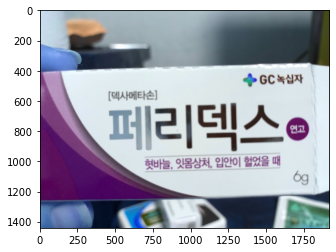

In [31]:
import matplotlib.pyplot as plt
import cv2

# plt.figure(figsize=(5,6))
img = cv2.imread('/Users/simmigyeong/Documents/GitHub/ProbonoICT/Korean_font_image/Text_in_the_wild/Goods/'
                +goods[0]['file_name'])
plt.imshow(img)

In [32]:
import random
import os

In [35]:
goods_data = os.listdir('Korean_font_image/Text_in_the_wild/Goods/')
print('goods_files 리스트 원소 개수 : ', len(goods_data))
print()

# random.shuffle(goods_data)
# random.shuffle은 inplace 모듈 -> 입력값(이미지)에 대한 순서 그 자체를 바꿈.
# goods_train_annotations 오류 해결 시 착각하지 않도록.
# np.random.seed(0)

# 이전 생성된 .json 파일과 분할 데이터셋 비교

train_data_num = int(len(goods_data) * 0.6)
validation_data_num = int(len(goods_data) * 0.2)
test_data_num = int(len(goods_data) * 0.2)

print("분할한 각 데이터셋의 개수")
print('train_data 개수 : ', train_data_num)
print('validation_data 개수 : ', validation_data_num)
print('test_data 개수 : ', test_data_num)

goods_files 리스트 원소 개수 :  37220

분할한 각 데이터셋의 개수
train_data 개수 :  22332
validation_data 개수 :  7444
test_data 개수 :  7444


In [36]:
train_data_num = int(len(goods_data) * 0.6)
validation_data_num = int(len(goods_data) * 0.2)
test_data_num = int(len(goods_data) * 0.2)

print("분할한 각 데이터셋의 개수")
print('train_data 개수 : ', train_data_num)
print('validation_data 개수 : ', validation_data_num)
print('test_data 개수 : ', test_data_num)

분할한 각 데이터셋의 개수
train_data 개수 :  22332
validation_data 개수 :  7444
test_data 개수 :  7444


In [37]:
# 각 데이터셋 분할

train_data = goods_data[ : train_data_num]
validation_data = goods_data[train_data_num : train_data_num + validation_data_num]
test_data = goods_data[validation_data_num : ]

In [38]:
# 확인용
for i in file['images'][:3]:
    print(i)

{'id': '00000001', 'width': 1920, 'height': 1440, 'file_name': 'FFF2F34A08347075F55E72B240EFE691.jpg', 'type': 'book'}
{'id': '00000002', 'width': 1920, 'height': 1440, 'file_name': 'FFDE6BAEADC9EDD31E51A1D1F687310F.jpg', 'type': 'book'}
{'id': '00000003', 'width': 1920, 'height': 1440, 'file_name': 'FFCFEB9E1D09544D6B458717DB4D6B7C.jpg', 'type': 'book'}


In [39]:
# 확인용
for i in file['images'][:3]:
    for key, value in i.items():
        print(key, value)
    print('----------')

id 00000001
width 1920
height 1440
file_name FFF2F34A08347075F55E72B240EFE691.jpg
type book
----------
id 00000002
width 1920
height 1440
file_name FFDE6BAEADC9EDD31E51A1D1F687310F.jpg
type book
----------
id 00000003
width 1920
height 1440
file_name FFCFEB9E1D09544D6B458717DB4D6B7C.jpg
type book
----------


In [40]:
# train/validation/test 이미지 데이터에 해당하는 id 값 저장

train_data_id = {}
validation_data_id = {}
test_data_id = {}

# for i in file['images']:
for image in file['images']:
    # image에서 'file_name' key에 대한 value 값이 train_data에 있으면,
    # 즉 이미지 이름이 동일하면 
    if image['file_name'] in train_data:
        
        # file['images'] 의 구조와 같이 train_data_id를 만들어주고, 
        # 여기서 'file_name' key를 'id'에 해당하는 값으로 넣어주기 -> 취소!!!!
        
        # train_data_id라는 딕셔너리의 " 키 : 값 " 은
        # file['images']에서 각 리스트 원소인 딕셔너리 형태로 된 image에서
        # image['file_name'] : image['id'] 로 한다.
        
        train_data_id[image['file_name']] = image['id']
        
    elif image['file_name'] in validation_data:
        validation_data_id[image['file_name']] = image['id']
        
    elif image['file_name'] in test_data:
        test_data_id[image['file_name']] = image['id']

print(test_data_id)

{'FFDE6BAEADC9EDD31E51A1D1F687310F.jpg': '00000002', 'FDFC8414963AFAD12E984C1ACE77C732.jpg': '00000016', 'FD274E3B9967D6D962C6470E687B7E13.jpg': '00000020', 'FD007D031348E9C2B7782D03F5DD4F02.jpg': '00000021', 'FBCF226A21636890F2FDAE9C1073357B.jpg': '00000026', 'F9392840439D542238B561688064B65D.jpg': '00000037', 'F8FEF3169D4EF48B6C87E3DDF0366D40.jpg': '00000038', 'F6C5577CA660EB045EC90CBE019F9A3B.jpg': '00000048', 'F6BFA5DD7EAB8A040ADC073D351547E8.jpg': '00000049', 'F56A6F23DBC083D2C751A48B42AF6518.jpg': '00000058', 'F4377A9EDFE2F58A452592B21D12A3D9.jpg': '00000068', 'F2B58BA76705D687B8D42F17B721063B.jpg': '00000071', 'EF02984F79BA24FB3DEA39586FA97168.jpg': '00000078', 'EE90722DA9FF340951C05B274C1A4BFB.jpg': '00000079', 'EB999A07744F017ADE03B9FB0D4BBD90.jpg': '00000087', 'EA9681C3491F145437A3E42025B165CE.jpg': '00000093', 'EA83C9CCFA4C22593BB5A2C709BCC60C.jpg': '00000094', 'EA14475347C387F511EE567FAF2F4777.jpg': '00000097', 'E9AA5FFE91EEE9C9754B277FBDE0DC43.jpg': '00000101', 'E78DEB14FA

In [41]:
train_img_ids = {}
validation_img_ids = {}
test_img_ids = {}

for image in file['images']:
    
    if image['file_name'] in train_data:
        train_img_ids[image['file_name']] = image['id']
        
    elif image['file_name'] in validation_data:
        validation_img_ids[image['file_name']] = image['id']
        
    elif image['file_name'] in test_data:
        test_img_ids[image['file_name']] = image['id']
        
        
print(train_img_ids)

{'FFCFEB9E1D09544D6B458717DB4D6B7C.jpg': '00000003', 'FFA657987BBC93F1B53A5D398D644828.jpg': '00000004', 'FF78796AFFBF58474995A33D7104123B.jpg': '00000006', 'FEE60E107171A712FA88E30E999B5F26.jpg': '00000007', 'FEB0CFF0438117DBD3E872675074D7B4.jpg': '00000009', 'FEAA13AB164AA59876AE3364EF4CBF29.jpg': '00000010', 'FE2B68CB935088CE2C7B022BAF1EE3E3.jpg': '00000012', 'FE2A7F8FC2370849BA36B8E27A6A42C6.jpg': '00000013', 'FE060444A94790E86304C728EA6E029F.jpg': '00000015', 'FBB6E7717E9D58FD08E6642E7BE75D9F.jpg': '00000027', 'FB859E4E0F8833FC0592977DB41436CC.jpg': '00000028', 'FB14E0AEDB6BFBF1C4446568AF5728A8.jpg': '00000029', 'FADEDE84994C5EB61B3E349DED6C7A68.jpg': '00000030', 'FAACA6D759E913A275CFABCA8195CA4F.jpg': '00000031', 'FA239C233059C95E43ECBB91B46425DB.jpg': '00000032', 'FA1DFC158D59270040DC199A3B5A2A8B.jpg': '00000033', 'F9D797F938CAD107E6B4CCD906BA150A.jpg': '00000034', 'F9D0537403624E1851348EFC6B9E97AA.jpg': '00000035', 'F8AF4B7C8E96885553C706C199616B48.jpg': '00000040', 'F88BA52D05

In [42]:
# train/validation/test 이미지들에 해당하는 id 값을 저장
# train/validation/test_annotaions 딕셔너리 구조인 " 키 : 값 "에서
# 키 = 각 이미지의 파일명 -> 위에서 image['file_name']에 해당하는 값

train_annotations = {f : [] for f in train_data_id.keys()}
validation_annotations = {f : [] for f in validation_data_id.keys()}
test_annotations = {f : [] for f in test_data_id.keys()}

# train_data_id : {'FFDE6BAEADC9EDD31E51A1D1F687310F.jpg': '00000002', ... } 
# id_는 리스트
# train_data_id[id_]는 이미지 id 번호
# train_data_id라는 딕셔너리에서 id_는 key값인 '~.jpg'의 이미지 file_name
# train_data_id 와 train_id_data 는 key : value 구조가 반대!

train_id_data = { train_data_id[id_] : id_ for id_ in train_data_id}
validation_id_data = { validation_data_id[id_] : id_ for id_ in validation_data_id}
test_id_data = { test_data_id[id_] : id_ for id_ in test_data_id}

print(test_id_data)

{'00000002': 'FFDE6BAEADC9EDD31E51A1D1F687310F.jpg', '00000016': 'FDFC8414963AFAD12E984C1ACE77C732.jpg', '00000020': 'FD274E3B9967D6D962C6470E687B7E13.jpg', '00000021': 'FD007D031348E9C2B7782D03F5DD4F02.jpg', '00000026': 'FBCF226A21636890F2FDAE9C1073357B.jpg', '00000037': 'F9392840439D542238B561688064B65D.jpg', '00000038': 'F8FEF3169D4EF48B6C87E3DDF0366D40.jpg', '00000048': 'F6C5577CA660EB045EC90CBE019F9A3B.jpg', '00000049': 'F6BFA5DD7EAB8A040ADC073D351547E8.jpg', '00000058': 'F56A6F23DBC083D2C751A48B42AF6518.jpg', '00000068': 'F4377A9EDFE2F58A452592B21D12A3D9.jpg', '00000071': 'F2B58BA76705D687B8D42F17B721063B.jpg', '00000078': 'EF02984F79BA24FB3DEA39586FA97168.jpg', '00000079': 'EE90722DA9FF340951C05B274C1A4BFB.jpg', '00000087': 'EB999A07744F017ADE03B9FB0D4BBD90.jpg', '00000093': 'EA9681C3491F145437A3E42025B165CE.jpg', '00000094': 'EA83C9CCFA4C22593BB5A2C709BCC60C.jpg', '00000097': 'EA14475347C387F511EE567FAF2F4777.jpg', '00000101': 'E9AA5FFE91EEE9C9754B277FBDE0DC43.jpg', '00000107':

In [43]:
# 딕셔너리 자체에 대해 for문을 통해 출력하면 key 값이 조회!!

for id_ in train_data_id:
    print(id_)

FFCFEB9E1D09544D6B458717DB4D6B7C.jpg
FFA657987BBC93F1B53A5D398D644828.jpg
FF78796AFFBF58474995A33D7104123B.jpg
FEE60E107171A712FA88E30E999B5F26.jpg
FEB0CFF0438117DBD3E872675074D7B4.jpg
FEAA13AB164AA59876AE3364EF4CBF29.jpg
FE2B68CB935088CE2C7B022BAF1EE3E3.jpg
FE2A7F8FC2370849BA36B8E27A6A42C6.jpg
FE060444A94790E86304C728EA6E029F.jpg
FBB6E7717E9D58FD08E6642E7BE75D9F.jpg
FB859E4E0F8833FC0592977DB41436CC.jpg
FB14E0AEDB6BFBF1C4446568AF5728A8.jpg
FADEDE84994C5EB61B3E349DED6C7A68.jpg
FAACA6D759E913A275CFABCA8195CA4F.jpg
FA239C233059C95E43ECBB91B46425DB.jpg
FA1DFC158D59270040DC199A3B5A2A8B.jpg
F9D797F938CAD107E6B4CCD906BA150A.jpg
F9D0537403624E1851348EFC6B9E97AA.jpg
F8AF4B7C8E96885553C706C199616B48.jpg
F88BA52D05D72FDDDA004D4861E91199.jpg
F86C8BCA1A5D00979D1D047BEF618969.jpg
F79CC7A65EBF7877891FECE6183D9DA4.jpg
F7800F8048EC10E018D38020FCCA10C3.jpg
F67D5D287BDE177BD7FA29F125AD4F0D.jpg
F60A80E684FFAE8A62DF4C652487CA42.jpg
F5E4C7A1C037CE197458BCFED468676B.jpg
F51E540D02156BF146DE56D36AE6DF9F.jpg
F

4CA3536CFC2F4C9E1EA491D771C5497F.jpg
4C7D9E5327281E0C1CD288FDF95EDDF0.jpg
4C48EAD9C846A3603405D9FE8C915AC9.jpg
4BF20AB5C86AA2EBA725FD2FA748F518.jpg
4BAA950F034F427E38CF9FA95C02C64C.jpg
4B92425148401D8CF07EB3781D01E976.jpg
4B5F5D21D6AF2ADB4998DF6C554A3D66.jpg
4B1D92FE6860CFB6889F5B958EF108C1.jpg
4B0A73AA94914DD1BA881B29F6C10543.jpg
4ABF6826EAB6876D886575BB1FFCCDAD.jpg
4AB90782B6622BD9DF0136AA3A2160FC.jpg
4A6963AF72E1C371F1CA454E22A0B515.jpg
4A42311B454D3674BD8B2F4381D47640.jpg
4A3C684BFBC8BD3396015D07B141B450.jpg
46C274D5EF4353F272CDD094C2139FDE.jpg
45E92455C6ACA2B1E729531FB65B0C19.jpg
45DF1E38F696B4F7C3C1C2A99D7F1577.jpg
45D334E770FDB75BA814C34D9B4724C1.jpg
45C461A6DC1454CBCED6FF2A40CF10A2.jpg
44ED59F2F28BAC1CAC234C37C108B4E6.jpg
44C68AD117F5881966DEE3E0AFE43B69.jpg
44B068D358E9FA2C412027FCDDC0C449.jpg
44A9DB0403ABA9FA8E77B8EC69A4ADFE.jpg
42CB117B229346297C62BF4ED806986B.jpg
40B4F6DE35DFF9681134C03538F12A81.jpg
3D760AAE80E78B62FB02FB44F055B7CA.jpg
3D6D2F501B51E32DCD6870089B89524E.jpg
3

1D0AD41880567847F3BBB03CA91B207B.jpg
1CD823D57C3A2489BE375B7C7C67CEB9.jpg
1CC6F157C5C5FA32DB6B37595DF60BB9.jpg
1CB7504D7E5A7D67412090EDF6432E7A.jpg
1C6B05F8CE0E4EF65B375CC62B18272F.jpg
1C63A49DE997AA3AE0BE82C7E2FCFAB0.jpg
1C6041FFDD9F99A2C06A08F4754CA00B.jpg
1C603510A0F5E2281B42C3DD11FAC30A.jpg
1C5D0D74250DBD6144E4716D68251091.jpg
1C50CF72F8C0A0BE1A1F1773F5F99E43.jpg
1BE984DCEC2BD825B7BF595A6DC41EC6.jpg
1BDD1EC9F8FFFDB05EB6B28EFE82C46D.jpg
1BC7667EBFC65B6A348D6E2B4E053C2D.jpg
1BB69E6C3956C4BE390FE5847A321D63.jpg
1B703F0701CE1E1BE4E1E4A8B35B77F7.jpg
1B5FEF59C534A17C28C3A9C38C476516.jpg
1B5BDAD3878D5DA4C92CBD5BCAF48DEA.jpg
1B517CA4CC324607C176036ACAAB83CA.jpg
1B4D9B676BCE7477A69D6CDBBD327601.jpg
1B46C5CE5711BCE5ED442E6CEED7C105.jpg
1B0603E00FEF161D41A905719F864289.jpg
1AF066B944C76C4F41785C9587136F94.jpg
1AE5933BAFD2E3F5675D1539C9353001.jpg
1AE1305D01E90C8C413B229E57D63511.jpg
1A9EF72078859538B166517E346A0276.jpg
1A4CB365F2E204E879955FC8BE51061F.jpg
1A37DF0CF67BDF2B4B2D7F3492489275.jpg
1

1000E1B6D09453E24FE1927B011D3D51.jpg
0FA44B96169472A4706D0C3F6ECB98CA.jpg
0F94FC616DE9A1569AD69C5457986B72.jpg
0F79FA60D088DA1038394648AFFC8993.jpg
0F752BBB58FC98D92C0ADD263BAC7DDC.jpg
0F6C74F6EF4138F17959A6DEF5088598.jpg
0F62DB4AEFB4BD299956BA938BA34DF0.jpg
0F54EE7CAC57036B8C831AEB8D11C9D2.jpg
0F3F34A4F87353982CB0DFF027CF0557.jpg
0F3C30FAD839174E8C09AF884BA43CF2.jpg
0F365D40B574A11F20AFD6008935799A.jpg
0F22C388925A8A99EF09EBB801B2B060.jpg
0ED916A47736BA1C1095296FA6D3D5DC.jpg
0ECDFD1B47A80CDBA57859112DFE31A6.jpg
0ECB465BF0B7431891FD8D36710A9B7E.jpg
0EC141EBDFD14C92DC4CD5E056362BD0.jpg
0EBBF54F5CCB506E179DE39181B52658.jpg
0EAA76DF408DADFFD67D5D668245916B.jpg
0EA520E44BB6BD7006AB6A564E9CD6DA.jpg
0E9C7246D2EF1DA9B79397BEAB0D5BA1.jpg
0E7A7C405AC0D4471F7FF3AF9A853665.jpg
0E7857AE10A7A47B0E680FA979849922.jpg
0E6B02E6DD2037724D634430BD0BFC99.jpg
0E6492EA6BAE7FA46388C942959FB49B.jpg
0E51272E40AB11C8982947CB57AC3881.jpg
0E3817DBF08BA9351A80CF28183E62A7.jpg
0E0F2F52E76F0CD860245A37F5030A65.jpg
0

9EAB3D3C458A1AD94D6725C6DF5798E5.jpg
9E95842F95ED0FE62E12A01D66D8539C.jpg
9E7A39B5D29CEB960412022EA5B44FC0.jpg
9E58D36509396DB53800B0DA6263435D.jpg
9E3EB3849C2B86B4CF6ED3799E950D03.jpg
9E2961061DC0062A5362242CD1C88F9F.jpg
9DCAC338A05473BBEC267221AE18E892.jpg
9D9233CBC9C1B5AA1777C07E18FEFAE9.jpg
9CE73DE3D7D4DDCD4CC92021EB51A167.jpg
9C85824135BEDECB0C878711F08A1FC7.jpg
9C5BA419A1F0AD9D53A1031C9C186120.jpg
9C41D1DC0C7E872419BC9CD9E8AC6613.jpg
9C32A35DF74A7A41A95DC5909402226B.jpg
9BC1C093C75A7516BCC7617478BBE057.jpg
9B158B42BE80AD80C61B5C20DAE1A08B.jpg
9AAC9500A6308B8DA061DC84CD297D5B.jpg
9A3D867C6B07C1A45A9056ED0BEFB998.jpg
9A2F6CA7AE957E5D122892EF883AA230.jpg
99C9CC3CA4D62C400C47805B9DC40AD8.jpg
99B85F1C171F8F887BB46EDC33AF4FC4.jpg
99A79D6932B25CEAF7A464AF3AAA1EFB.jpg
99A04162B0FD3A5F16A14DBBCB54D468.jpg
995FFF32181A4DBD69F376B4537CFCAF.jpg
99540736FC96B43073725F2FE22954BC.jpg
98CF6AFEEECC002E4CAEB8350BD677A1.jpg
986615148692B8CAC3EFF409F38EF3A5.jpg
9859E2E47F4EF44472B8D7BF43606F1D.jpg
9

9121E01A0D1944DCF28CFFD66B679E4A.jpg
90CF9C536842E47A6A563E2395C98173.jpg
90A402DE05A994DCBED1F8D5E1F16F31.jpg
907CCF64D8CCEB7FF261D28F96A1BBAB.jpg
901EF35F461C88DA6652344F5465E7BF.jpg
8FBF2CD4A787DBBC396DD06A64742E8D.jpg
8F95B8684C3C9FD9EEA05C91F4FB7F0C.jpg
8F86022FDCA99A340DF666B0B23DCDD3.jpg
8F3527B89CADF49A36A6C0D325B7D61D.jpg
8ED78E5A0BBC26B413C66E1C8A6FADD6.jpg
8EC592387FB16F2F23AACBCEBAEE04DA.jpg
8EC5075B375E4F3286817E1D81193CBA.jpg
8E71408F8946B75470BD0229C5A743EA.jpg
8E64B47F17C978C3CC9DC4223C35C90D.jpg
8E198224D1B10DCE95893F6718CA7B0F.jpg
8DA8B89968ACDD7E31A4C3041CC17A12.jpg
8CCE8704F12E8DA60B69E0555CB40F58.jpg
8CC73EDB016A02850AE90CBB85892E98.jpg
8CA729526B7C70F86370EC70CEFE6D20.jpg
8CA248A7DCC383A03EC95C8746E3929C.jpg
8C8BFB8EE7D1B809820C69A3D914C338.jpg
8C5AFB153F6F744FBB2C1493A636B021.jpg
8C44F6AD655256DBE18BEB8469FA92E5.jpg
8C41AD4FDB2189424EA78EC7D6A9F936.jpg
8C32E4D28B53776BF04EFA1551BAE4AB.jpg
8BB170B2B08C8604ADEA5A7147C1A842.jpg
8B5B1A9953D988EC77546963EE75C2D8.jpg
8

68BF460D41C1126FB6CB2ECEC7574418.jpg
68A8F73792097E7536FD7ABB8BF5AC2B.jpg
67D643B560F032AC2CF35309C9D0ED58.jpg
67D47DED86523F3DDC3C0A30A32AC5F8.jpg
66F2866F4CF5B975AD8324C4506C5808.jpg
66F09F45DAA22366E070C93B82A3B31E.jpg
66D5D62EF585F417FB807E3187465663.jpg
66C58ABFB22CDE85CAF3D64407E014F1.jpg
66A44A7CBC1F038447AE60E6923883BA.jpg
65E54576904787BC1D930D3F48D5880C.jpg
65E13F23551F950E71F156027E0D6DD6.jpg
65D72641CECDAD6DEFDA4DE60BCFB329.jpg
65BF4CD50095FFDE7E9ABF91B6DA56BC.jpg
65BD8261CABEF85581C1484F706A19DF.jpg
64FB4DDA1DB7E940A99B9E6AE463CDE0.jpg
64EE1EFCAC029E49350F00E329342EC3.jpg
64A5C4D2B85F8E46CB97CC4CEC7540F5.jpg
63FD29EF96F9B30FD7E20329506DB34C.jpg
63FB6A459484AB65E837234D7257314C.jpg
63FA62A3BF9D58A29AEB79C469ECF53B.jpg
63E8C27A87AE560DE65AE513E9BA6F28.jpg
63C0974B227B75403D975AE3D543279F.jpg
63B17ED923D9A1F244CE690A7E7C3703.jpg
63AB55561ACE55E5EF3208056347A1AB.jpg
63A9C198F570D3E064EA2F507445A0E9.jpg
62FF09554448EAC3E9A21B02EDB6F305.jpg
62DF70935C90D09EBE1AB9E4037724A7.jpg
6

1B98687986A232F45CDD9AFCC49219CF.jpg
1B6A6977A41546CA6207E5F2B2547832.jpg
1B692859C2F7EF5104924A4807358C2C.jpg
1B5FFB13A0A629C77C3ADE872557A53D.jpg
1B22A07518B9BB97E19319ACB5C9B3ED.jpg
1B20FE6008A7331A155EC64312DF60CB.jpg
1B0A1CEF59EECE0EDF9EB608CE70A9AC.jpg
1AC20C90CE1D8A4ADDF24CC551200A12.jpg
1ABB8A8C6B67527ADE2CBB0729AFE0C7.jpg
1AB48DB8E8450A163696E528D2B83B11.jpg
1A560CC9920826BA6329EE2F815247D6.jpg
1A54A5C32D58F1ED51087EF54E74EF0C.jpg
1A11193AD6C1CF32C18CCCA8B6026C82.jpg
1A0EEFFEFC39C973DAF62DD2EC328493.jpg
1A01C3A64DDD74CDF9D6ED9A0A7AC323.jpg
19F410FAFEBE657E46EA982223FE64F5.jpg
19F3A628E7C7BA9798E4E417BE85101B.jpg
19DFAE4A02588E51802ECF4155E8603E.jpg
19DF31BB9B1265C1B23EE98828BAF55E.jpg
19BDC889205F521ABCD963E97DA6769A.jpg
19B85A0200A396FB26A4A0C0D7609C74.jpg
19AF6859D2169399C1D22A563B07CB7D.jpg
19A98D292E49C8F5A7DEBC9F22DE7570.jpg
198ADDC69BACE4138CF54E38E9A2229F.jpg
19785B89435157C3CD7739662BE5871C.jpg
19749380760A46F92EF19EDE64CD4488.jpg
195910427CF498F4F2760F214F65E301.jpg
1

2297A4C4E4F4646F3861B08056863E50.jpg
228A09490822C12D1B6B62A00B117BDB.jpg
2289D976BF583EBC97CFF2226CFBF038.jpg
22838A491B6248A2E39E74866CA38E67.jpg
2281C02802DB0509952A6F7505620F29.jpg
227D0DAEBCD219A70A484AE16E877894.jpg
227334507453A09F4F813E0C01B40DF1.jpg
22656CCFDB703540DD0C9571B38E4B1A.jpg
2257DB3DE4564C1B19A2012FB5B9FFEE.jpg
22415A49853F684E23E89E996C70E23D.jpg
223754D2B147562FBF3B5B6EC1B32C41.jpg
2217BE9C94291F66FC8F0984FE3605A0.jpg
21FF7BAA4A7A2379A9580A94E7018868.jpg
21F97DF3EE52A5E7B1C28E4D07EB644A.jpg
21CA7776CB7A16901D4F8343D7BA60C9.jpg
21C98E20984FC96F82C6004525BE8516.jpg
2195AFC7B3F980A87B40B7B2E49C9324.jpg
218F5451317CD8A0424AC5A534BA4ED7.jpg
2185092958F4B279B1A9327D1E0E6F19.jpg
216811A5C25E438DB225128A2AEA385C.jpg
2121739AC08D4E81FF43879327BA38BD.jpg
20FBC10218572172A1766E45654FAF68.jpg
20DD1A045631BE6351C48ADF5CE3D522.jpg
20C5B336BCBC83F46205A3AA0AAF2436.jpg
20BA3DBC6E1AEBFB107E4A85ACCB1D5D.jpg
20A3E24167A36FB1C57EBAA3502ED052.jpg
209093E3AB01EAD3CAA80CBBC58F8E9C.jpg
2

In [44]:
ex_list={'a' : 1, 'b' : 2, 'c' : 3}

for i in ex_list:
    print(i)

a
b
c


In [ ]:
for idx, annotaion in enumerate(file['annotations'][:5]):
#     if idx % 5000 == 0:
#         print(idx, '/', len(file['annotations']), 'processed')
        
#     if annotaion[]
    print(idx, annotaion)

In [45]:
for idx, annotation in enumerate(file['annotations']):
#     if idx % 5000 == 0:
#         print(idx, '/', len(file['annotations']), 'processed')
        
    if annotation['attributes']['class'] != 'word':
        continue
    
    # train_id_data에서 key값 (이미지 데이터의 id) 이 조회됨.
    if annotation['image_id'] in train_id_data:
        train_annotations[train_id_data[annotation['image_id']]].append(annotation)
        
    elif annotation['image_id'] in validation_id_data:
        validation_annotations[validation_id_data[annotation['image_id']]].append(annotation)
        
    elif annotation['image_id'] in test_id_data:
        test_annotations[test_id_data[annotation['image_id']]].append(annotation)
        

In [46]:
train_annotations

{'FFCFEB9E1D09544D6B458717DB4D6B7C.jpg': [{'id': '00000072',
   'image_id': '00000003',
   'text': '당신,',
   'attributes': {'class': 'word'},
   'bbox': [447, 34, 278, 147]},
  {'id': '00000073',
   'image_id': '00000003',
   'text': '거기',
   'attributes': {'class': 'word'},
   'bbox': [723, 38, 94, 48]},
  {'id': '00000074',
   'image_id': '00000003',
   'text': '있어줄래요?',
   'attributes': {'class': 'word'},
   'bbox': [833, 32, 324, 69]},
  {'id': '00000075',
   'image_id': '00000003',
   'text': '기욤',
   'attributes': {'class': 'word'},
   'bbox': [440, 204, 62, 29]},
  {'id': '00000076',
   'image_id': '00000003',
   'text': '뮈소',
   'attributes': {'class': 'word'},
   'bbox': [506, 206, 61, 28]}],
 'FFA657987BBC93F1B53A5D398D644828.jpg': [{'id': '00000096',
   'image_id': '00000004',
   'text': '역사',
   'attributes': {'class': 'word'},
   'bbox': [831, 998, 59, 33]},
  {'id': '00000097',
   'image_id': '00000004',
   'text': '지적',
   'attributes': {'class': 'word'},
   'bbox': [890

### train, validataion, test 상품 이미지의 파일 이름, annotation 정보가 담긴 .json 파일 생성

In [56]:
with open("goods_train_annotations_re.json", "w") as file:
    json.dump(train_annotations, file)
    
with open("goods_validation_annotations_re.json", "w") as file:
    json.dump(validation_annotations, file)
    
with open("goods_test_annotations_re.json", "w") as file:
    json.dump(test_annotations, file)

In [57]:
goods_train_json_re = json.load(open("goods_train_annotations_re.json"))
goods_validation_json_re = json.load(open("goods_validation_annotations_re.json"))
goods_test_json_re = json.load(open("goods_test_annotations_re.json"))

In [58]:
print('goods_train_json 개수 : ', len(goods_train_json_re.keys()))
print('goods_validation_json 개수 : ', len(goods_validation_json_re.keys()))
print('goods_test_json 개수 : ', len(goods_test_json_re.keys()))

goods_train_json 개수 :  22332
goods_validation_json 개수 :  7444
goods_test_json 개수 :  7444


In [59]:
# 위에서 train 데이터에 대한 json 파일 만들 때 annotation 오타.
# TypeError: '_io.TextIOWrapper' object is not subscriptable

goods_train_json_re

{'FFCFEB9E1D09544D6B458717DB4D6B7C.jpg': [{'id': '00000072',
   'image_id': '00000003',
   'text': '당신,',
   'attributes': {'class': 'word'},
   'bbox': [447, 34, 278, 147]},
  {'id': '00000073',
   'image_id': '00000003',
   'text': '거기',
   'attributes': {'class': 'word'},
   'bbox': [723, 38, 94, 48]},
  {'id': '00000074',
   'image_id': '00000003',
   'text': '있어줄래요?',
   'attributes': {'class': 'word'},
   'bbox': [833, 32, 324, 69]},
  {'id': '00000075',
   'image_id': '00000003',
   'text': '기욤',
   'attributes': {'class': 'word'},
   'bbox': [440, 204, 62, 29]},
  {'id': '00000076',
   'image_id': '00000003',
   'text': '뮈소',
   'attributes': {'class': 'word'},
   'bbox': [506, 206, 61, 28]}],
 'FFA657987BBC93F1B53A5D398D644828.jpg': [{'id': '00000096',
   'image_id': '00000004',
   'text': '역사',
   'attributes': {'class': 'word'},
   'bbox': [831, 998, 59, 33]},
  {'id': '00000097',
   'image_id': '00000004',
   'text': '지적',
   'attributes': {'class': 'word'},
   'bbox': [890

In [ ]:
# for image in file['images']:
#     if image['file_name'] == 

In [60]:
goods_validation_json_re

{'FF9F7F8E7468ED6E78E640A98279A6F8.jpg': [{'id': '00000122',
   'image_id': '00000005',
   'text': '창비',
   'attributes': {'class': 'word'},
   'bbox': [1393, 1207, 54, 44]},
  {'id': '00000123',
   'image_id': '00000005',
   'text': '몽실',
   'attributes': {'class': 'word'},
   'bbox': [758, 126, 198, 161]},
  {'id': '00000124',
   'image_id': '00000005',
   'text': '언니',
   'attributes': {'class': 'word'},
   'bbox': [991, 138, 236, 102]},
  {'id': '00000125',
   'image_id': '00000005',
   'text': '권정생',
   'attributes': {'class': 'word'},
   'bbox': [1055, 275, 50, 19]},
  {'id': '00000126',
   'image_id': '00000005',
   'text': '소년소설',
   'attributes': {'class': 'word'},
   'bbox': [1111, 275, 68, 18]},
  {'id': '00000127',
   'image_id': '00000005',
   'text': '그림',
   'attributes': {'class': 'word'},
   'bbox': [1257, 275, 34, 18]}],
 'FED2D72D15DCBC26FAC1C142FD704596.jpg': [{'id': '00000206',
   'image_id': '00000008',
   'text': '들리',
   'attributes': {'class': 'word'},
   'bbox

In [61]:
goods_test_json_re

{'FFDE6BAEADC9EDD31E51A1D1F687310F.jpg': [{'id': '00000034',
   'image_id': '00000002',
   'text': '중국문자학의',
   'attributes': {'class': 'word'},
   'bbox': [1664, 307, 75, 376]},
  {'id': '00000035',
   'image_id': '00000002',
   'text': '이해',
   'attributes': {'class': 'word'},
   'bbox': [1659, 713, 70, 120]},
  {'id': '00000036',
   'image_id': '00000002',
   'text': '읽기',
   'attributes': {'class': 'word'},
   'bbox': [1785, 571, 43, 112]}],
 'FDFC8414963AFAD12E984C1ACE77C732.jpg': [{'id': '00000405',
   'image_id': '00000016',
   'text': '중국문자학의',
   'attributes': {'class': 'word'},
   'bbox': [1689, 14, 101, 511]},
  {'id': '00000406',
   'image_id': '00000016',
   'text': '명랑가족놀이',
   'attributes': {'class': 'word'},
   'bbox': [522, 353, 577, 114]}],
 'FD274E3B9967D6D962C6470E687B7E13.jpg': [{'id': '00000500',
   'image_id': '00000020',
   'text': 'Couples',
   'attributes': {'class': 'word'},
   'bbox': [432, 967, 263, 43]},
  {'id': '00000501',
   'image_id': '00000020',
   '

In [55]:
goods_train_json_re

{'FFCFEB9E1D09544D6B458717DB4D6B7C.jpg': [],
 'FF9F7F8E7468ED6E78E640A98279A6F8.jpg': [],
 'FF78796AFFBF58474995A33D7104123B.jpg': [],
 'FEB0CFF0438117DBD3E872675074D7B4.jpg': [],
 'FEAA13AB164AA59876AE3364EF4CBF29.jpg': [],
 'FE358F6EFFD7006FDAF307F447CDCBFA.jpg': [],
 'FE2B68CB935088CE2C7B022BAF1EE3E3.jpg': [],
 'FE20A49B7918DF8315570AE4564EF22B.jpg': [],
 'FDFC8414963AFAD12E984C1ACE77C732.jpg': [],
 'FDC87976057D8F08A893ED71D433AED2.jpg': [],
 'FD007D031348E9C2B7782D03F5DD4F02.jpg': [],
 'FC8AC590ED0C49A1A960389B810939B2.jpg': [],
 'FBCF226A21636890F2FDAE9C1073357B.jpg': [],
 'FBB6E7717E9D58FD08E6642E7BE75D9F.jpg': [],
 'FB859E4E0F8833FC0592977DB41436CC.jpg': [],
 'FB14E0AEDB6BFBF1C4446568AF5728A8.jpg': [],
 'FADEDE84994C5EB61B3E349DED6C7A68.jpg': [],
 'FAACA6D759E913A275CFABCA8195CA4F.jpg': [],
 'FA1DFC158D59270040DC199A3B5A2A8B.jpg': [],
 'F9392840439D542238B561688064B65D.jpg': [],
 'F8AF4B7C8E96885553C706C199616B48.jpg': [],
 'F86C8BCA1A5D00979D1D047BEF618969.jpg': [],
 'F84E51A6